<a href="https://colab.research.google.com/github/chakkarinsan2/flickr30k/blob/main/clip_training100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [178]:
# check python version
%%bash
which python
python --version

/usr/local/bin/python
Python 3.7.16


In [179]:
%%bash

# make sure the conda path is clear so it does not conflict with conda
export PYTHONPATH=""

# download and install miniconda
conda_version='Miniconda3-py37_4.9.2-Linux-x86_64.sh'
wget https://repo.anaconda.com/miniconda/${conda_version}
chmod +x ${conda_version}
./${conda_version} -b -f -p /usr/local

# update miniconda
conda install --channel defaults conda python=3.7 --yes
conda update --channel defaults --all --yes

PREFIX=/usr/local
Unpacking payload ...
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... 
Found conflicts! Looking for incompatible packages.
This can take several minutes.  Press CTRL-C to abort.
failed
Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

## Package Plan ##

  environment location: /usr/local


The following packages will be UPDATED:

  cudatoolkit                           11.0.221-h6bb024c_0 --> 11.8.0-h6a678d5_0 
  jpeg                                        9b-h024ee3a_2 --> 9e-h5eee18b_1 
  libtiff                                  4.2.0-h85742a9_0 --> 4.5.0-h6a678d5_2 
  libwebp            

--2023-06-20 18:58:12--  https://repo.anaconda.com/miniconda/Miniconda3-py37_4.9.2-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.130.3, 104.16.131.3, 2606:4700::6810:8203, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.130.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90040905 (86M) [application/x-sh]
Saving to: ‘Miniconda3-py37_4.9.2-Linux-x86_64.sh.4’

     0K .......... .......... .......... .......... ..........  0% 4.55M 19s
    50K .......... .......... .......... .......... ..........  0% 4.63M 19s
   100K .......... .......... .......... .......... ..........  0% 17.2M 14s
   150K .......... .......... .......... .......... ..........  0% 11.0M 13s
   200K .......... .......... .......... .......... ..........  0% 12.8M 11s
   250K .......... .......... .......... .......... ..........  0% 17.3M 10s
   300K .......... .......... .......... .......... ..........  0% 20.8M 9s
   350K .......... .......... .

In [180]:
%%bash
which python
python --version

/usr/local/bin/python
Python 3.7.16


In [181]:
%%bash

# install dependencies to clip
conda install --yes -c pytorch pytorch=1.7.1 torchvision cudatoolkit=11.0
pip install ftfy regex tqdm wget

# install clip
pip install git+https://github.com/openai/CLIP.git

Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - cudatoolkit=11.0
    - pytorch=1.7.1
    - torchvision


The following packages will be SUPERSEDED by a higher-priority channel:

  pytorch            pkgs/main::pytorch-1.12.1-cpu_py37hb1~ --> pytorch::pytorch-1.7.1-py3.7_cuda11.0.221_cudnn8.0.5_0 
  torchvision        pkgs/main::torchvision-0.13.1-cpu_py3~ --> pytorch::torchvision-0.8.2-py37_cu110 

The following packages will be DOWNGRADED:

  cudatoolkit                             11.8.0-h6a678d5_0 --> 11.0.221-h6bb024c_0 
  jpeg                                        9e-h5eee18b_1 --> 9b-h024ee3a_2 
  libtiff                                  4.5.0-h6a678d5_2 --> 4.2.0-h85742a9_0 
  libwebp                                  1.2.4-h11a3e52_1 --> 1.2.0-h89dd481_0 
  libwebp-base                             1.2.



==> WARNING: A newer version of conda exists. <==
  current version: 23.1.0
  latest version: 23.5.0

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.5.0




In [182]:
import sys

# make sure the conda libraries are recognized here
_ = sys.path.append("/usr/local/lib/python3.7/site-packages")

In [183]:
import torch
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"

# load model and image preprocessing
model, preprocess = clip.load("ViT-B/32", device=device, jit=False)

In [184]:
from pathlib import Path

# สร้างโฟลเดอร์ชื่อ xxx เพื่อ mount drive จาก google drive ให้ไปทำงานใน google colab
!mkdir flickr30k

# โหลด zip file รูปภาพ
if not Path('flickr30k/flickr100_images.zip').exists():
  !wget https://github.com/chakkarinsan2/flickr30k/releases/download/training/flickr100_images.zip -O flickr30k/flickr100_images.zip


# โหลดไฟล์ caption แบบ csv
if not Path('flickr30k/results_revised100.csv').exists():
  !wget https://github.com/chakkarinsan2/flickr30k/releases/download/training/results_revised100.csv -O flickr30k/results_revised100.csv


mkdir: cannot create directory ‘flickr30k’: File exists


In [185]:
# แตก zip รูปภาพลงในโฟลเดอร์  flickr30k_images

!unzip "/content/flickr30k/flickr100_images.zip" -d "/content/flickr30k/flickr100_images"


Archive:  /content/flickr30k/flickr100_images.zip
replace /content/flickr30k/flickr100_images/1067675215.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/flickr30k/flickr100_images/1067675215.jpg  
  inflating: /content/flickr30k/flickr100_images/1009434119.jpg  
  inflating: /content/flickr30k/flickr100_images/1009692167.jpg  
  inflating: /content/flickr30k/flickr100_images/1010031975.jpg  
  inflating: /content/flickr30k/flickr100_images/1010087179.jpg  
  inflating: /content/flickr30k/flickr100_images/1010087623.jpg  
  inflating: /content/flickr30k/flickr100_images/1010470346.jpg  
  inflating: /content/flickr30k/flickr100_images/1010673430.jpg  
  inflating: /content/flickr30k/flickr100_images/1011572216.jpg  
  inflating: /content/flickr30k/flickr100_images/1012150929.jpg  
  inflating: /content/flickr30k/flickr100_images/1012212859.jpg  
  inflating: /content/flickr30k/flickr100_images/1012328893.jpg  
  inflating: /content/flickr30k/flickr100_images/101353688

In [186]:
# กำหนด path ของโฟลเดอร์ flickr30k ในการเรียกใช้ในครั้งต่อๆไป
path = '/content/flickr30k/flickr100_images'

In [187]:
# ตรวจสอบจำนวนรูปภาพในโฟลเดอร์ (=30000)
import os
len(os.listdir(path))

100

In [188]:
import pandas as pd

# แสดงจำนวนรายการ caption ใน results.csv
df = pd.read_csv('/content/flickr30k/results_revised100.csv', header=None, sep='|')
df = df[0].str.split(',', expand=True)

print(df.shape)

df.head(500)

(500, 3)


,0,1,2
0,1009434119.jpg,0,A black and white dog is running in a grassy ...
1,1009434119.jpg,1,A Boston Terrier is running on lush green gra...
2,1009434119.jpg,2,A black and white dog is running through the ...
3,1009434119.jpg,3,A dog runs on the green grass near a wooden f...
4,1009434119.jpg,4,A Boston terrier is running in the grass .
...,...,...,...
495,1067675215.jpg,0,A man lies on a mat in a parking lot between ...
496,1067675215.jpg,1,A shirtless man is laying down in the middle ...
497,1067675215.jpg,2,A man laying down in middle of street during ...
498,1067675215.jpg,3,A man in blue shorts lays down outside in a p...


In [189]:
# ตรวจสอบรายชื่อรูปภาพใน path
data = []

for filename in os.listdir(path):
    if filename.endswith("jpg"):
        # แสดงรายชื่อรูปภาพ
        print(filename)
        data.append(filename)

1055753357.jpg
1011572216.jpg
1043910339.jpg
1021293940.jpg
1012328893.jpg
1017675163.jpg
1065831604.jpg
1016626169.jpg
1028205764.jpg
1010673430.jpg
1022975728.jpg
1066252238.jpg
1026792563.jpg
1026685415.jpg
1059514525.jpg
1039360778.jpg
1047921035.jpg
1056873310.jpg
1055623002.jpg
1065323785.jpg
1021442086.jpg
1030985833.jpg
1061467336.jpg
1034985636.jpg
1053804096.jpg
1012212859.jpg
1057251835.jpg
1010470346.jpg
1013536888.jpg
1034276567.jpg
1019077836.jpg
1010087623.jpg
1052358063.jpg
1027211271.jpg
1045124251.jpg
1027149103.jpg
1035019794.jpg
1018148011.jpg
1032460886.jpg
1024138940.jpg
1010087179.jpg
1021332107.jpg
1009692167.jpg
1029737941.jpg
1030041880.jpg
1049955899.jpg
1060605297.jpg
1020651753.jpg
1057210460.jpg
1042590306.jpg
1051290485.jpg
1024613706.jpg
1061887159.jpg
1031973097.jpg
1056359656.jpg
1016887272.jpg
1067180831.jpg
1035392784.jpg
1054620089.jpg
1057089366.jpg
1028982826.jpg
1045521051.jpg
1018057225.jpg
1066831905.jpg
1043819504.jpg
1039637574.jpg
1051205546

**Training Model**

In [190]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-kjhkew_s
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369395 sha256=b4e9dd3f28d9d450c4cac8a5756895c2e2e326727ae825f13434457bccfa4435
  Stored in directory: /tmp/pip-ephem-wheel-cache-n_ik1ur4/wheels/fd/b9/c3/5b4470e35ed76e174bff77c92f91da82098d5e35fd5bc8cdac
Successfully built clip


In [191]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)

Torch version: 2.0.1+cu118


In [192]:
import clip

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [193]:
model, preprocess = clip.load("ViT-B/32")
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


In [194]:
# get full dataset (image+text)
import os.path
from typing import Dict, Tuple

import pandas as pd
import tensorflow as tf


def get_full_dataset(
    batch_size: int = 32, image_size: Tuple[int, int] = (256, 256)
) -> tf.data.Dataset:
    data = pd.read_csv(os.path.join(DATA_ABS_PATH, "/content/flickr30k/results_revised100.csv"))
    images_path = os.path.join(DATA_ABS_PATH, "/content/flickr30k/flickr100_images/")
    data["image"] = data["image"].map(lambda x: os.path.join(images_path, f"{x}.jpg"))
    filenames: tf.Tensor = tf.constant(data["image"], dtype=tf.string)
    data["label"] = data["label"].str.lower()
    class_name_to_label: Dict[str, int] = {
        label: i for i, label in enumerate(set(data["label"]))
    }
    labels: tf.Tensor = tf.constant(
        data["label"].map(class_name_to_label.__getitem__), dtype=tf.uint8
    )
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))

    def _parse_function(filename, label):
        jpg_image: tf.Tensor = tf.io.decode_jpeg(tf.io.read_file(filename))
        return tf.image.resize(jpg_image, size=image_size), label

    dataset = dataset.map(_parse_function)
    return dataset.batch(batch_size)


**Image Preprocessing**

data augmentation and analysis from clip.load() contains a torchvision Transform that performs this preprocessing.

In [195]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7ff2be83dd80>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

**Text Preprocessing**

using clip.tokenize(), the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [196]:
import pandas as pd

# split csv column
data = pd.read_csv("/content/flickr30k/results_revised100.csv", delimiter=",",header=None) # split by ,

print(data[2]) # only column[2] = caption

# text_enceode
clip.tokenize(data[2])

0       A black and white dog is running in a grassy ...
1       A Boston Terrier is running on lush green gra...
2       A black and white dog is running through the ...
3       A dog runs on the green grass near a wooden f...
4             A Boston terrier is running in the grass .
                             ...                        
495     A man lies on a mat in a parking lot between ...
496     A shirtless man is laying down in the middle ...
497     A man laying down in middle of street during ...
498     A man in blue shorts lays down outside in a p...
499       A man in blue shorts is laying in the street .
Name: 2, Length: 500, dtype: object


tensor([[49406,   320,  1449,  ...,     0,     0,     0],
        [49406,   320,  4399,  ...,     0,     0,     0],
        [49406,   320,  1449,  ...,     0,     0,     0],
        ...,
        [49406,   320,   786,  ...,     0,     0,     0],
        [49406,   320,   786,  ...,     0,     0,     0],
        [49406,   320,   786,  ...,     0,     0,     0]], dtype=torch.int32)

**Setting up input images and texts**

input images and text descriptions to the model, and compare the similarity between the corresponding features.

In [197]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

description = {print(data[2])}
descriptions = {"page": "a page of text about segmentation"}

0       A black and white dog is running in a grassy ...
1       A Boston Terrier is running on lush green gra...
2       A black and white dog is running through the ...
3       A dog runs on the green grass near a wooden f...
4             A Boston terrier is running in the grass .
                             ...                        
495     A man lies on a mat in a parking lot between ...
496     A shirtless man is laying down in the middle ...
497     A man laying down in middle of street during ...
498     A man in blue shorts lays down outside in a p...
499       A man in blue shorts is laying in the street .
Name: 2, Length: 500, dtype: object


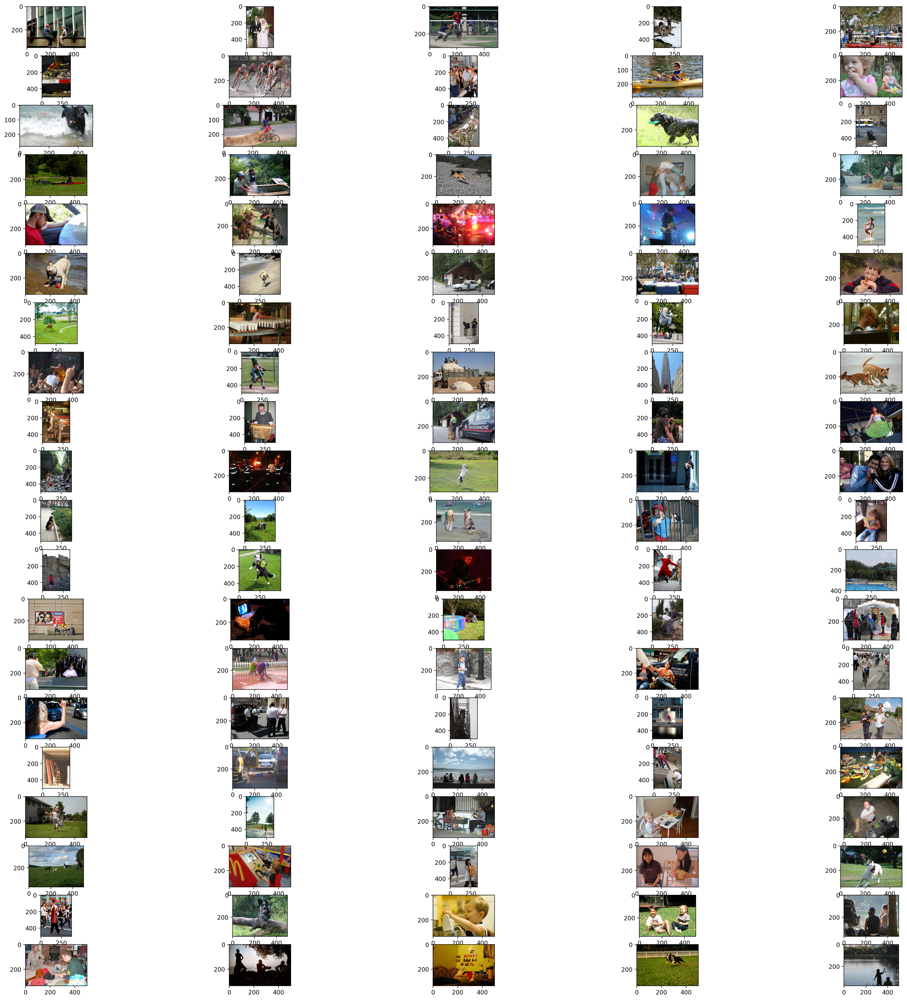

<Figure size 1600x500 with 0 Axes>

In [198]:
# แสดงรูปภาพทั้งหมด
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

images = []
for img_path in glob.glob('/content/flickr30k/flickr100_images/*.jpg'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(30,30))
columns = 5
for i, image in enumerate(images):
    plt.subplot(int(len(images) / 5) , 5, i + 1)
    plt.imshow(image)

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()

In [199]:
image_input = torch.tensor(np.stack(images))
text_tokens = clip.tokenize(["This is " + desc for desc in texts])

In [200]:
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

**Calculating cosine similarity**

between the features and calculate the dot product of each pair.

In [201]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

**Testing**

Image to be processed


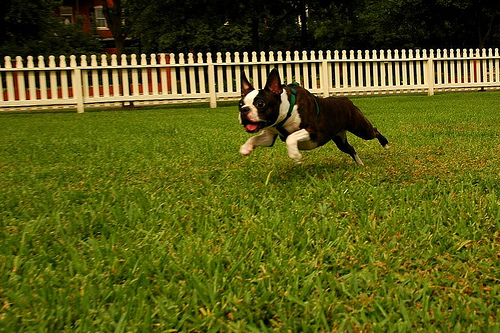



Tensor shape:
torch.Size([1, 3, 224, 224])


In [202]:
from PIL import Image

# load image โดยสุ่มเลือกรูปมาจาก google drive
image = Image.open(r"/content/flickr30k/flickr100_images/1009434119.jpg")
print("Image to be processed")
display(image)

# pre-process image
image = preprocess(image).unsqueeze(0).to(device)
print("\n\nTensor shape:")
print(image.shape)

In [203]:
with torch.no_grad():
    image_features = model.encode_image(image)
print(image_features.shape)

torch.Size([1, 512])


In [204]:
# นำเข้า caption จาก csv เพื่อทดสอบการเรียนรู้ของ model ว่าถูกต้องเพียงใด 5 caption per image
text_snippets = ["a boston terrier", "a boston terrier dog", "photo of a boston terrier dog"]

# pre-process text
text = clip.tokenize(text_snippets).to(device)
print(text.shape)

torch.Size([3, 77])


In [205]:
with torch.no_grad():
    text_features = model.encode_text(text)
print(text_features.shape)

torch.Size([3, 512])


In [206]:
with torch.no_grad():
    logits_per_image, logits_per_text = model(image, text)
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()

print("ค่าความน่าจะเป็นในการพยากรณ์:", probs)

ค่าความน่าจะเป็นในการพยากรณ์: [[0.27944002 0.30873784 0.4118222 ]]
